<a href="https://colab.research.google.com/github/aravind-02/Prasanth-Covid19-Genome-Sequence-Prediction/blob/main/covid_19_rna_sequence_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Thu Sep 14 22:06:56 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.161.03   Driver Version: 470.161.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install biopython
!pip install Squiggle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 39.4 MB/s eta 0:00:00


## Importing Necessary Dependencies

In [ ]:
import plotly
import folium
import warnings
import Bio.SeqIO
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import plotly.express as px
import plotly.offline as py
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from datetime import date
from Bio import pairwise2
from Bio.Data import CodonTable
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest,f_classif
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot, plot_mpl

warnings.filterwarnings('ignore')
init_notebook_mode(connected=True)
plt.rcParams.update({'font.size': 14})

## Loading Datasets

In [ ]:
confirmed_df = pd.read_csv('../input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed.csv')
deaths_df = pd.read_csv('../input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths.csv')
recoveries_df = pd.read_csv('../input/novel-corona-virus-2019-dataset/time_series_covid_19_recovered.csv')
na_columns = (confirmed_df.isna().sum() / confirmed_df.shape[0]) > 0.99
na_columns = na_columns[na_columns]
confirmed_df = confirmed_df.drop(na_columns.index, axis=1)
deaths_df = deaths_df.drop(na_columns.index, axis=1)
recoveries_df = recoveries_df.drop(na_columns.index, axis=1)
confirmed_df = confirmed_df.melt(id_vars=['Country/Region', 'Province/State', 'Lat', 'Long'], var_name='date', value_name='confirmed')
deaths_df = deaths_df.melt(id_vars=['Country/Region', 'Province/State', 'Lat', 'Long'], var_name='date', value_name='deaths')
recoveries_df = recoveries_df.melt(id_vars=['Country/Region', 'Province/State', 'Lat', 'Long'], var_name='date', value_name='recoveries')
confirmed_df['date'] = pd.to_datetime(confirmed_df['date'])
deaths_df['date'] = pd.to_datetime(deaths_df['date'])
recoveries_df['date'] = pd.to_datetime(recoveries_df['date'])
full_df = confirmed_df.merge(recoveries_df).merge(deaths_df)
full_df = full_df.rename(columns={'Country/Region': 'Country', 'date': 'Date', 'confirmed': "Confirmed", "recoveries": "Recoveries", "deaths": "Deaths"})
world_df = full_df.groupby(['Date']).agg({'Confirmed': ['sum'], 'Recoveries': ['sum'], 'Deaths': ['sum']}).reset_index()
world_df.columns = world_df.columns.get_level_values(0)

def add_rates(df):
    df['Confirmed Change'] = df['Confirmed'].diff().shift(-1)

    df['Mortality Rate'] = df['Deaths'] / df['Confirmed']
    df['Recovery Rate'] = df['Recoveries'] / df['Confirmed']
    df['Growth Rate'] = df['Confirmed Change'] / df['Confirmed']
    df['Growth Rate Change'] = df['Growth Rate'].diff().shift(-1)
    df['Growth Rate Accel'] = df['Growth Rate Change'] / df['Growth Rate']
    return df

world_df = add_rates(world_df)

## Worldwide Cases Analysis

In [ ]:
def plot_aggregate_metrics(df, fig=None):
    if fig is None:
        fig = go.Figure()
    fig.update_layout(template='plotly_dark')
    fig.add_trace(go.Scatter(x=df['Date'],
                             y=df['Confirmed'],
                             mode='lines+markers',
                             name='Confirmed',
                             line=dict(color='Yellow', width=2)
                            ))
    fig.add_trace(go.Scatter(x=df['Date'],
                             y=df['Deaths'],
                             mode='lines+markers',
                             name='Deaths',
                             line=dict(color='Red', width=2)
                            ))
    fig.add_trace(go.Scatter(x=df['Date'],
                             y=df['Recoveries'],
                             mode='lines+markers',
                             name='Recoveries',
                             line=dict(color='Green', width=2)
                            ))
    return fig

In [ ]:
plot_aggregate_metrics(world_df).show()

## Worldwide Rates Analysis

In [ ]:
def plot_diff_metrics(df, fig=None):
    if fig is None:
        fig = go.Figure()

    fig.update_layout(template='plotly_dark')
    fig.add_trace(go.Scatter(x=df['Date'],
                             y=df['Mortality Rate'],
                             mode='lines+markers',
                             name='Mortality rate',
                             line=dict(color='red', width=2)))

    fig.add_trace(go.Scatter(x=df['Date'],
                             y=df['Recovery Rate'],
                             mode='lines+markers',
                             name='Recovery rate',
                             line=dict(color='Green', width=2)))

    fig.add_trace(go.Scatter(x=df['Date'],
                             y=df['Growth Rate'],
                             mode='lines+markers',
                             name='Growth rate confirmed',
                             line=dict(color='Yellow', width=2)))
    fig.update_layout(yaxis=dict(tickformat=".2%"))

    return fig

In [ ]:
plot_diff_metrics(world_df).show()

## Log Scaled Confirmed Cases by Country

In [ ]:
confirmed_by_country_df = full_df.groupby(['Date', 'Country']).sum().reset_index()
fig = px.line(confirmed_by_country_df, x='Date', y='Confirmed', color='Country', line_group="Country", hover_name="Country")
fig.update_layout(
    template='plotly_dark',
    yaxis_type="log"
)
fig.show()

In [ ]:
data= pd.read_csv("../input/novel-corona-virus-2019-dataset/covid_19_data.csv")
data['Date'] = data['ObservationDate'].apply(pd.to_datetime)
data.drop(['SNo'],axis=1,inplace=True)
data.rename(columns={'Country/Region':'Country'},inplace = True)
countries = data['Country'].unique().tolist()

# Combining China and Mainland China cases
data['Country'].replace({'Mainland China':'China'},inplace=True)
countries = data['Country'].unique().tolist()

d = data['Date'][-1:].astype('str')
year = int(d.values[0].split('-')[0])
month = int(d.values[0].split('-')[1])
day = int(d.values[0].split('-')[2].split()[0])

data_latest = data[data['Date'] >= pd.Timestamp(date(year,month,day))]

# Creating a dataframe with total no of confirmed cases for every country
Number_of_countries = len(data_latest['Country'].value_counts())

cases = pd.DataFrame(data_latest.groupby('Country')['Confirmed'].sum())
cases['Country'] = cases.index
cases.index=np.arange(1,Number_of_countries+1)

global_cases = cases[['Country','Confirmed']]
#global_cases.sort_values(by=['Confirmed'],ascending=False)

# Importing the world_coordinates dataset
world_coordinates = pd.read_csv('../input/world-coordinates/world_coordinates.csv')

# Merging the coordinates dataframe with original dataframe
world_data = pd.merge(world_coordinates,global_cases,on='Country')
world_data.head()

# create map and display it
world_map = folium.Map(location=[10, -20], zoom_start=2.3,tiles='Stamen Toner')

for lat, lon, value, name in zip(world_data['latitude'], world_data['longitude'], world_data['Confirmed'], world_data['Country']):
    folium.CircleMarker([lat, lon],
                        radius=10,
                        popup = ('<strong>Country</strong>: ' + str(name).capitalize() + '<br>'
                                '<strong>Confirmed Cases</strong>: ' + str(value) + '<br>'),
                        color='red',

                        fill_color='red',
                        fill_opacity=0.7 ).add_to(world_map)
world_map

## Dataset Preparation for Predicting Mutations/Next seq in RNA

In [ ]:
path="../input/coronavirus-genome-sequence/MN908947.txt"
file=open(path,'r')
data=[[]]
for line in file:
    data.append([line])
df1=pd.DataFrame(data,columns=['sequence'])
df1=df1.drop(df1.index[0],axis=0)
df1=df1.drop(df1.index[0],axis=0)
df1=df1.drop(df1.index[427],axis=0)
df1

,sequence
2,ATTAAAGGTTTATACCTTCCCAGGTAACAAACCAACCAACTTTCGA...
3,CGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTG...
4,TAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGC...
5,TTGCAGCCGATCATCAGCACATCTAGGTTTCGTCCGGGTGTGACCG...
6,CCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTT...
...,...
424,CAGACCACACAAGGCAGATGGGCTATATAAACGTTTTCGCTTTTCC...
425,GTGCAGAATGAATTCTCGTAACTACATAGCACAAGTAGATGTAGTT...
426,TTAATCAGTGTGTAACATTAGGGAGGACTTGAAAGAGCCACCACAT...
427,GATCGAGTGTACAGTGAACAATGCTAGGGAGAGCTGCCTATATGGA...


In [ ]:
abstracts=df1['sequence']

In [ ]:
tokenizer=tf.keras.preprocessing.text.Tokenizer(num_words=None,lower=False,char_level=True)
tokenizer.fit_on_texts(abstracts)
sequences=tokenizer.texts_to_sequences(abstracts)

In [ ]:
idx_word=tokenizer.index_word

In [ ]:
idx_word

{1: 'T', 2: 'A', 3: 'G', 4: 'C', 5: '\n'}

In [ ]:
features=[]
labels=[]
training_length=70
num_words=len(idx_word)+1
for seq in sequences:
    for i in range(training_length,len(seq)):
        extract=seq[i-training_length:i+1]
        features.append(extract[:-2])
        labels.append(extract[-2])


label_array=np.zeros((len(features),num_words),dtype=np.int8)
for example_index,word_index in enumerate(labels):
    label_array[example_index,word_index]=1

In [ ]:
X = np.array(sequences)
y = np.array(label_array)

X = X.reshape(7,61,71)
y = y.reshape(7,61,6)

In [ ]:
print("Shape of X is: " + str(X.shape) + " Shape of y is: " + str(y.shape))

Shape of X is: (7, 61, 71) Shape of y is: (7, 61, 6)


In [ ]:
X_train, X_test = train_test_split(X, test_size=0.15, shuffle=False)
y_train, y_test = train_test_split(y, test_size=0.15, shuffle=False)

In [ ]:
def get_lstm_model():

    inputs = tf.keras.layers.Input(shape=(X_train.shape[1:]))

    x = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences=True))(inputs)

    output = tf.keras.layers.Dense(64, activation='relu', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05),
                                    bias_initializer='zeros',
                                    kernel_regularizer=tf.keras.regularizers.L1L2(l1=1e-5, l2=1e-4),
                                    bias_regularizer=tf.keras.regularizers.L2(1e-4),
                                    activity_regularizer=tf.keras.regularizers.L2(1e-5))(x)
    output = tf.keras.layers.Dense(32, activation='relu', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05),
                                    bias_initializer='zeros',
                                    kernel_regularizer=tf.keras.regularizers.L1L2(l1=1e-5, l2=1e-4),
                                    bias_regularizer=tf.keras.regularizers.L2(1e-4),
                                    activity_regularizer=tf.keras.regularizers.L2(1e-5))(output)
    output = tf.keras.layers.Dense(num_words, activation='softmax')(output)



    model = tf.keras.models.Model(inputs=inputs, outputs=output)

    model.compile(
        metrics = ["accuracy"],
        optimizer = tf.keras.optimizers.Adam(),
        loss = tf.keras.losses.mean_squared_error
    )

    return model

In [ ]:
model = get_lstm_model()
print(model.summary())

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 61, 71)]          0         
_________________________________________________________________
bidirectional (Bidirectional (None, 61, 256)           204800    
_________________________________________________________________
dense (Dense)                (None, 61, 64)            16448     
_________________________________________________________________
dense_1 (Dense)              (None, 61, 32)            2080      
_________________________________________________________________
dense_2 (Dense)              (None, 61, 6)             198       
Total params: 223,526
Trainable params: 223,526
Non-trainable params: 0
_________________________________________________________________
None


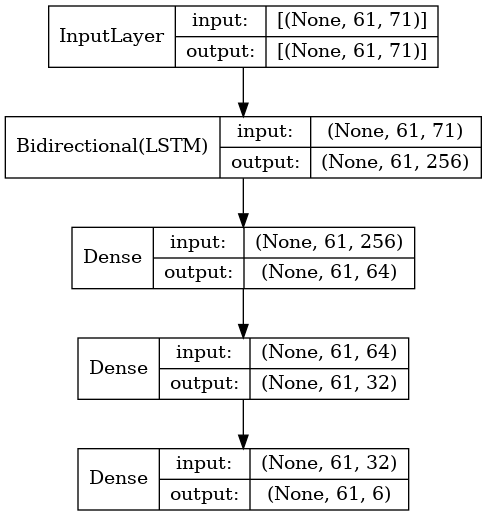

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=False, to_file="lstmmodel.png")

In [ ]:
lstmhistory = model.fit(X_test, y_test, epochs=60, validation_data=(X_test, y_test), verbose=1)

Epoch 1/60
1/1 [==============================] - 6s 6s/step - loss: 0.1537 - accuracy: 0.1230 - val_loss: 0.1490 - val_accuracy: 0.3197
Epoch 2/60
1/1 [==============================] - 0s 31ms/step - loss: 0.1490 - accuracy: 0.3197 - val_loss: 0.1471 - val_accuracy: 0.2459
Epoch 3/60
1/1 [==============================] - 0s 31ms/step - loss: 0.1471 - accuracy: 0.2459 - val_loss: 0.1462 - val_accuracy: 0.2459
Epoch 4/60
1/1 [==============================] - 0s 31ms/step - loss: 0.1462 - accuracy: 0.2459 - val_loss: 0.1455 - val_accuracy: 0.2459
Epoch 5/60
1/1 [==============================] - 0s 31ms/step - loss: 0.1455 - accuracy: 0.2459 - val_loss: 0.1449 - val_accuracy: 0.2459
Epoch 6/60
1/1 [==============================] - 0s 30ms/step - loss: 0.1449 - accuracy: 0.2459 - val_loss: 0.1443 - val_accuracy: 0.2459
Epoch 7/60
1/1 [==============================] - 0s 46ms/step - loss: 0.1443 - accuracy: 0.2459 - val_loss: 0.1436 - val_accuracy: 0.2459
Epoch 8/60
1/1 [=============

## LSTM Model Evaluation

In [ ]:
def print_acc(history):
    plt.figure(figsize=(20,10))
    plt.subplot(1, 2, 1)
    plt.suptitle('Optimizer : Adam', fontsize=10)
    plt.ylabel('Loss', fontsize=16)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend(loc='upper right')

    plt.subplot(1, 2, 2)
    plt.ylabel('Accuracy', fontsize=16)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.show()

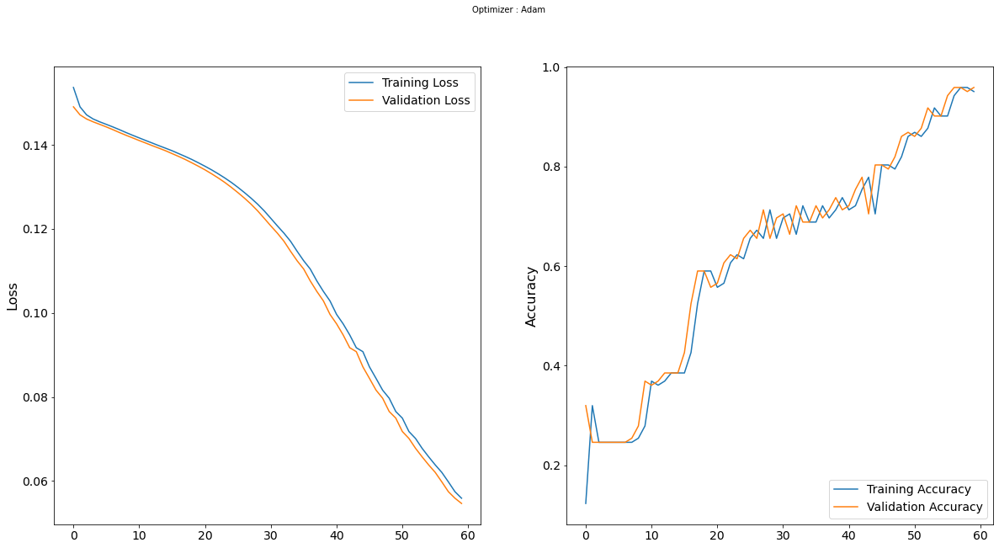

In [ ]:
print_acc(lstmhistory)

## Saving LSTM Model

In [ ]:
model.save("lstmmodel.h5")

In [ ]:
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    # Normalization and Attention
    x = tf.keras.layers.LayerNormalization(epsilon=1e-6)(inputs)
    x = tf.keras.layers.MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(x, x)
    x = tf.keras.layers.Dropout(dropout)(x)
    res = x + inputs

    # Feed Forward Part
    x = tf.keras.layers.LayerNormalization(epsilon=1e-6)(res)
    x = tf.keras.layers.Conv1D(filters=ff_dim, kernel_size=1, activation="relu")(x)
    x = tf.keras.layers.Dropout(dropout)(x)
    x = tf.keras.layers.Conv1D(filters=inputs.shape[-1], kernel_size=1)(x)
    return x + res

The main part of our model is now complete. We can stack multiple of those transformer_encoder blocks and we can also proceed to add the final Multi-Layer Perceptron classification head. Apart from a stack of Dense layers, we need to reduce the output tensor of the TransformerEncoder part of our model down to a vector of features for each data point in the current batch. A common way to achieve this is to use a pooling layer.

In [ ]:
def build_model(
    input_shape,
    head_size,
    num_heads,
    ff_dim,
    num_transformer_blocks,
    mlp_units,
    dropout=0,
    mlp_dropout=0,
):
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    #x = tf.keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    for dim in mlp_units:
        x = tf.keras.layers.Dense(dim, activation="relu", kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05),
                                    bias_initializer='zeros',
                                    kernel_regularizer=tf.keras.regularizers.L1L2(l1=1e-5, l2=1e-4),
                                    bias_regularizer=tf.keras.regularizers.L2(1e-4),
                                    activity_regularizer=tf.keras.regularizers.L2(1e-5))(x)
        x = tf.keras.layers.Dropout(mlp_dropout)(x)
    outputs = tf.keras.layers.Dense(6, activation="softmax")(x)
    return tf.keras.Model(inputs, outputs)

In [ ]:
input_shape = X_train.shape[1:]

model = build_model(
    input_shape,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    mlp_dropout=0.4,
    dropout=0.7,
)

model.compile(
    loss = tf.keras.losses.mean_squared_error,
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    metrics=["accuracy"],
)
print(model.summary())

NameError: name 'X_train' is not defined

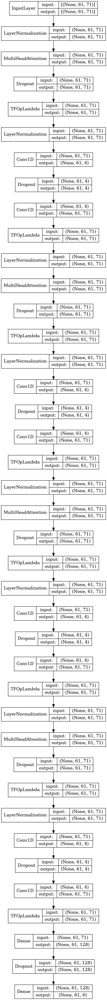

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=False, to_file="transformermodel.png")

In [ ]:
trans_history = model.fit(
    X_train,
    y_train,
    validation_data=(X_test, y_test),
    epochs=800,
    verbose=0
)

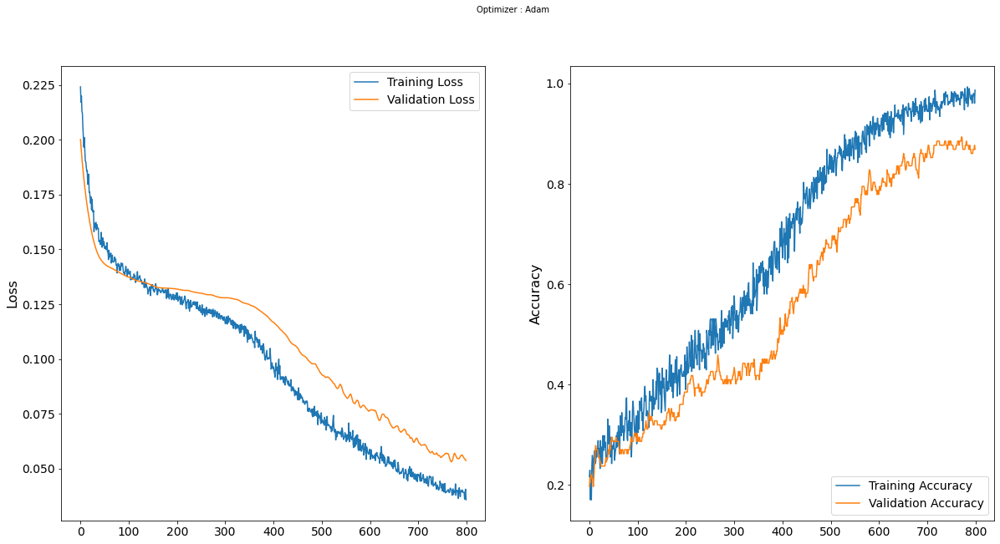

In [ ]:
print_acc(trans_history)

## Conclusions

Having the ability to predict the next RNA sequence of a virus can be crucial in the process of vaccine design process as it gives reliable insights about the mutations we might face in the future.

As when it comes to the deep learning models used in here we can notice that the LSTM model overperformed the transformer based one and it was more immune to overfitting that's why we will be using the LSTM based network in our deployment process.

When it comes to the worldwide situation quick analysis we can have some insights about the countries that succeeded in facing the pandemic so we can adopt theit strategies and document the process for future countermeasures